<div><img style="float: left; padding-right: 3em;" src="https://avatars.githubusercontent.com/u/19476722" width="150" /><div/>

# Earth Data Science Coding Challenge!
Before we get started, make sure to read or review the guidelines below. These will help make sure that your code is **readable** and **reproducible**. 

## Don't get **caught** by these Jupyter notebook gotchas

<img src="https://miro.medium.com/v2/resize:fit:4800/format:webp/1*o0HleR7BSe8W-pTnmucqHA.jpeg" width=300 style="padding: 1em; border-style: solid; border-color: grey;" />

  > *Image source: https://alaskausfws.medium.com/whats-big-and-brown-and-loves-salmon-e1803579ee36*

These are the most common issues that will keep you from getting started and delay your code review:

1. When you try to run some code on GitHub Codespaces, you may be prompted to select a **kernel**.
   * The **kernel** refers to the version of Python you are using
   * You should use the **base** kernel, which should be the default option. 
   * You can also use the `Select Kernel` menu in the upper right to select the **base** kernel
2. Before you commit your work, make sure it runs **reproducibly** by clicking:
   1. `Restart` (this button won't appear until you've run some code), then
   2. `Run All`

## Check your code to make sure it's clean and easy to read

<img src="https://encrypted-tbn0.gstatic.com/images?q=tbn:ANd9GcSO1w9WrbwbuMLN14IezH-iq2HEGwO3JDvmo5Y_hQIy7k-Xo2gZH-mP2GUIG6RFWL04X1k&usqp=CAU" height=200 />

* Format all cells prior to submitting (right click on your code).
* Use expressive names for variables so you or the reader knows what they are. 
* Use comments to explain your code -- e.g. 
  ```python
  # This is a comment, it starts with a hash sign
  ```

## Label and describe your plots

![Source: https://xkcd.com/833](https://imgs.xkcd.com/comics/convincing.png)

Make sure each plot has:
  * A title that explains where and when the data are from
  * x- and y- axis labels with **units** where appropriate
  * A legend where appropriate


## Icons: how to use this notebook
We use the following icons to let you know when you need to change something to complete the challenge:
  * &#128187; means you need to write or edit some code.
  
  * &#128214;  indicates recommended reading
  
  * &#9998; marks written responses to questions
  
  * &#127798; is an optional extra challenge
  

---

# Chicago Urban Greenspace

In this notebook, you will write code to calculate statistics about urban greenspace in Chicago. You will then use a linear model to identify statistically significant correlations between the distribution of greenspace and socioeconomic data collected by the U.S. Census. For your analysis, you will be roughly following the methodology of [this paper about Portland, OR green space](https://doi.org/10.3390/f7080162).

![](https://s3.amazonaws.com/medill.wordpress.offload/WP%20Media%20Folder%20-%20medill-reports-chicago/wp-content/uploads/sites/3/2019/03/lincoln-parkflickr-sized.jpg)

> Image source: [Medill News](https://news.medill.northwestern.edu/chicago/friends-of-the-parks-alleges-chicago-green-spaces-still-map-racial-inequality/)

### Working with larger-than-memory (big) data

The National Agricultural Imagery Program (NAIP) data for the City of Chicago takes up about 20GB. This amount of data is likely to crash your kernel if you try to load it all in at once. It also would be inconvenient to store on your harddrive so that you can load it in a bit at a time for analysis. Even if your are using a computer that would be able to handle this amount of data, imagine if you were analysing the entire United States over multiple years!

To help with this problem, you will use cloud-based tools to calculate your statistics instead of downloading rasters to your computer or container. You can perform basic calculations such as clipping and computing summary statistics entirely in the cloud, provided you give `rioxarray` the right kind of URL.

### Check your work with testing!

This notebook does not have pre-built tests. You will need to write your own test code to make sure everything is working the way that you want. For many operations, this will be as simple as creating a plot to check that all your data lines up spatially the way you were expecting, or printing values as you go.

## STEP 1: Set up your analysis

For this analysis, you will need a few packages that may not be in your environment:

  * pystac-client will help you search for cloud data in a STAC (SpatioTemporal Access Catalogs)
  * `census` and `us` will help you access U.S. Census data
  
**YOUR TASK:**

1. Install required packages using the command (`-y` tells conda to automatically continue with the install instead of asking for permission):
   ```bash
   conda install -y -c conda-forge pystac-client census us
   ```
2. Import necessary packages
3. Create **reproducible file paths** for your project file structure.

**Please store your data files somewhere in `~/earthpy-analytics/data`. This helps me keep my data files organized when I am grading, and helps you avoid large data files in your GitHub repository.**

In [1]:
import getpass
import os
import panel as pn
import shutil
import time
import tqdm
from glob import glob

import cartopy.crs as ccrs
import census
import earthpy as et
import earthpy.earthexplorer as etee
import geopandas as gpd
import geoviews as gv
import holoviews as hv
import hvplot.pandas
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import pystac_client
import rioxarray as rxr
import rioxarray.merge as rxrmerge
import seaborn as sns
import shapely
import us
from census import Census
import sklearn
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error, r2_score
from us import states


# Create data directories 
data_dir = os.path.join(et.io.HOME, et.io.DATA_NAME)
chi_dir = os.path.join(data_dir, 'chicago_boundary')
census_dir = os.path.join(data_dir, 'census_il')
lake_dir = os.path.join(data_dir, 'lake_michigan')
naip_dir = os.path.join(data_dir, 'naip')

for a_dir in [chi_dir, census_dir, lake_dir, naip_dir]:
    if not os.path.exists(a_dir):
            os.makedirs(a_dir)

os.environ["GDAL_HTTP_MAX_RETRY"] = "5"
os.environ["GDAL_HTTP_RETRY_DELAY"] = "2"

In [2]:
et.io.HOME
et.io.DATA_NAME

'earth-analytics\\data'

## STEP 2 - Download/Access Urban Greenspaces and Census Data

### Download City of Chicago Boundary

You can find the City of Chicago Boundary on the [City of Chicago Data Portal](https://data.cityofchicago.org/). 

> **Make sure to download in `Original` format**, as the `Shapefile` format has not been working lately.

**YOUR TASK:**

  1. Download the City of Chicago Boundary
  2. Use a **conditional statement** to cache the boundary at a **reproducible file path**

In [3]:
# Specify file path
chi_path = os.path.join(chi_dir, 'chicago-boundary.shp')

# Check if the file exists
if not os.path.exists(chi_path):
    chi_url = (
        "https://data.cityofchicago.org/api/geospatial/"
        "ewy2-6yfk?method=export&format=Original")
    gpd.read_file(chi_url).to_file(chi_path)
    
chi_gdf = gpd.read_file(chi_path)

# Check the boundary if download was succesful

chi_gdf

chi_map = (gv.tile_sources.OSM
  * chi_gdf.to_crs(3857).hvplot(
      line_color = 'black', fill_color=None, line_width=3,
      xaxis=None, yaxis=None))

# Save the plot
hv.save(chi_map, 'chicago_boundary.html')

YOUR ANSWER HERE

### Download census tracts and select those that intersect the study boundary

You can obtain urls for the U.S. Census Tract shapefiles from [the TIGER service](https://www.census.gov/geographies/mapping-files/time-series/geo/tiger-line-file.html). You'll notice that these URLs use the state FIPS, which you can get from the `us` package using the command `us.states.ABBR.fips` (e.g. for the state of Colorado it would be `us.states.CO.fips`.

**YOUR TASK:**

1. Download the Census tract Shapefile for the state of Illinois (IL)
2. Use a **conditional statement** to cache the download
3. Use a **spatial join** to select only the Census tracts that lie at least partially within the City of Chicago boundary

In [4]:
# Specify file path
census_path = os.path.join(census_dir, 'census_il.shp')

# Check appropiate census track number
illinois_fips = us.states.IL.fips
illinois_fips

# Check if the file exists
if not os.path.exists(census_path):
    census_url = (
        "https://www2.census.gov/geo/tiger/"
        "TIGER2023/TRACT/tl_2023_{illinois_fips}_tract.zip")
    gpd.read_file(census_url).to_file(census_path)
    
census_gdf = gpd.read_file(census_path)

# Check the boundary if download was succesful
census_gdf.geometry

0       POLYGON ((-90.55724 41.49433, -90.55724 41.494...
1       POLYGON ((-90.55731 41.49337, -90.55727 41.493...
2       POLYGON ((-90.55779 41.46279, -90.55772 41.463...
3       POLYGON ((-90.58261 41.46694, -90.58260 41.467...
4       POLYGON ((-88.27831 39.88075, -88.27786 39.883...
                              ...                        
3260    POLYGON ((-89.67947 41.79957, -89.67946 41.800...
3261    POLYGON ((-90.24791 41.74694, -90.24790 41.747...
3262    POLYGON ((-89.92104 41.59391, -89.92093 41.593...
3263    POLYGON ((-88.28454 42.10354, -88.28437 42.103...
3264    POLYGON ((-88.29059 42.11451, -88.29058 42.114...
Name: geometry, Length: 3265, dtype: geometry

In [5]:
#Check crs for spatial join
chi_gdf.crs
census_gdf.crs

<Geographic 2D CRS: EPSG:4269>
Name: NAD83
Axis Info [ellipsoidal]:
- Lat[north]: Geodetic latitude (degree)
- Lon[east]: Geodetic longitude (degree)
Area of Use:
- name: North America - onshore and offshore: Canada - Alberta; British Columbia; Manitoba; New Brunswick; Newfoundland and Labrador; Northwest Territories; Nova Scotia; Nunavut; Ontario; Prince Edward Island; Quebec; Saskatchewan; Yukon. Puerto Rico. United States (USA) - Alabama; Alaska; Arizona; Arkansas; California; Colorado; Connecticut; Delaware; Florida; Georgia; Hawaii; Idaho; Illinois; Indiana; Iowa; Kansas; Kentucky; Louisiana; Maine; Maryland; Massachusetts; Michigan; Minnesota; Mississippi; Missouri; Montana; Nebraska; Nevada; New Hampshire; New Jersey; New Mexico; New York; North Carolina; North Dakota; Ohio; Oklahoma; Oregon; Pennsylvania; Rhode Island; South Carolina; South Dakota; Tennessee; Texas; Utah; Vermont; Virginia; Washington; West Virginia; Wisconsin; Wyoming. US Virgin Islands. British Virgin Islands

In [6]:
# Spatial join census tracks with Chicago boundary
census_gdf = census_gdf.to_crs(chi_gdf.crs)
chi_tract = gpd.sjoin(
    census_gdf, chi_gdf, how='inner', predicate='intersects')
chi_tract

,STATEFP,COUNTYFP,TRACTCE,GEOID,GEOIDFQ,NAME_left,NAMELSAD,MTFCC,FUNCSTAT,ALAND,AWATER,INTPTLAT,INTPTLON,geometry,index_right,OBJECTID,NAME_right,SHAPE_AREA,SHAPE_LEN
198,17,031,030101,17031030101,1400000US17031030101,301.01,Census Tract 301.01,G5020,S,127283,110999,+41.9910538,-087.6548790,"POLYGON ((1167200.978 1940497.837, 1167263.766...",0,1,CHICAGO,6.450277e+09,845282.931362
199,17,031,030701,17031030701,1400000US17031030701,307.01,Census Tract 307.01,G5020,S,69878,0,+41.9827453,-087.6579659,"POLYGON ((1167299.197 1937341.203, 1167361.991...",0,1,CHICAGO,6.450277e+09,845282.931362
200,17,031,070103,17031070103,1400000US17031070103,701.03,Census Tract 701.03,G5020,S,69094,0,+41.9268110,-087.6426051,"POLYGON ((1171771.953 1917124.829, 1171881.409...",0,1,CHICAGO,6.450277e+09,845282.931362
208,17,031,807900,17031807900,1400000US17031807900,8079,Census Tract 8079,G5020,S,2013730,0,+42.0041886,-087.7487798,"POLYGON ((1139485.946 1943791.335, 1139537.841...",0,1,CHICAGO,6.450277e+09,845282.931362
214,17,031,808001,17031808001,1400000US17031808001,8080.01,Census Tract 8080.01,G5020,S,2202703,0,+42.0070209,-087.7354065,"POLYGON ((1144330.234 1948739.134, 1144394.334...",0,1,CHICAGO,6.450277e+09,845282.931362
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2909,17,031,710700,17031710700,1400000US17031710700,7107,Census Tract 7107,G5020,S,490083,0,+41.7471100,-087.6568840,"POLYGON ((1167099.143 1850342.316, 1167165.446...",0,1,CHICAGO,6.450277e+09,845282.931362
2912,17,031,550100,17031550100,1400000US17031550100,5501,Census Tract 5501,G5020,S,7189486,1132186,+41.6631813,-087.5359785,"POLYGON ((1198442.772 1816547.620, 1198442.265...",0,1,CHICAGO,6.450277e+09,845282.931362
3070,17,031,710300,17031710300,1400000US17031710300,7103,Census Tract 7103,G5020,S,327581,0,+41.7540485,-087.6611057,"POLYGON ((1166979.651 1854999.677, 1167064.218...",0,1,CHICAGO,6.450277e+09,845282.931362
3173,17,043,840801,17043840801,1400000US17043840801,8408.01,Census Tract 8408.01,G5020,S,1812924,2775,+41.9517961,-087.9316177,"POLYGON ((1090176.505 1924633.083, 1090558.114...",0,1,CHICAGO,6.450277e+09,845282.931362


<Axes: >

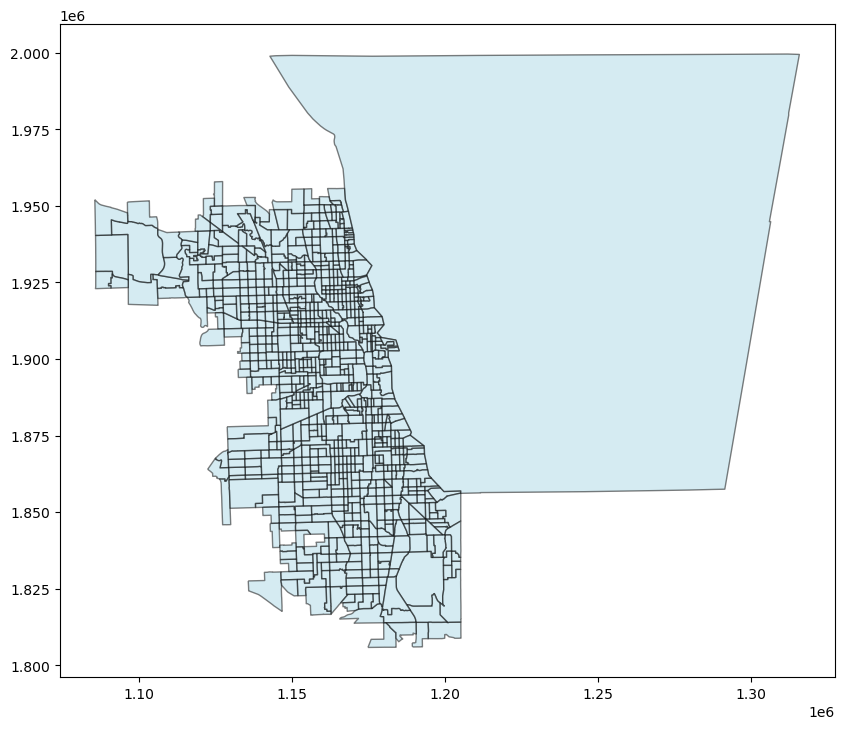

In [7]:
chi_tract.plot(
    color='lightblue', 
    edgecolor='black', 
    alpha=0.5, 
    figsize=(10, 10)
)

### Download Lake Michigan boundary and clip census tracts

If you plot the Census tract data you just downloaded, you will notice that the census tracts along the coast of Lake Michigan extend into the lake. This will throw off your analysis if you leave it there. There are a few ways to deal with this type of problem, but for now you can use a boundary for Lake Michigan to clip the Census tracts. You can find a shapefile for Lake Michigan from the [State of Michigan MapServer](https://gis-michigan.opendata.arcgis.com/datasets/lake-michigan-shoreline/explore?location=43.785916%2C-90.269240%2C7.00)

**YOUR TASK:**

  1. Download the Lake Michigan boundary file
  2. Use a **conditional statement** to cache the download
  3. Use the `.overlay` method of GeoDataFrames to clip off any parts of your Census tract boundaries that are in Lake Michigan

<Axes: >

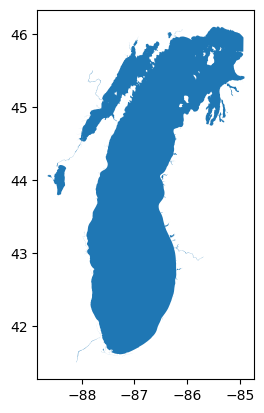

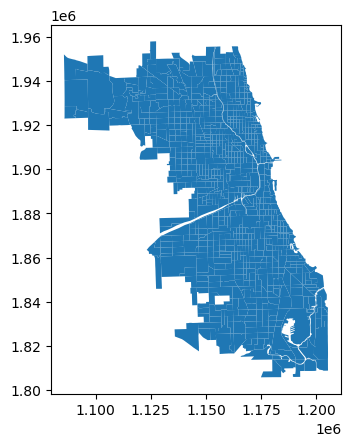

In [8]:
# The download API Explorer so the shapefile
# is not on my local computer

lake_path = os.path.join(lake_dir, 'lake_michigan.shp')

# Check if the file exists
if not os.path.exists(lake_path):
    lake_url = (
        "https://gisagocss.state.mi.us/arcgis/"
        "rest/services/OpenData/hydro/MapServer/"
        "12/query?where=1%3D1&outFields=*"
        "&outSR=4326&f=json")
    gpd.read_file(lake_url).to_file(lake_path)
    
lake_gdf = gpd.read_file(lake_path)

# Check the lake download
lake_gdf.plot()

# Match crs with other layer 
lake_gdf = lake_gdf.to_crs(chi_tract.crs)

# Clip tracts to lake boundary
chi_tract_clip = gpd.overlay(chi_tract, lake_gdf, how='difference')

# Check 
chi_tract_clip.plot()

YOUR ANSWER HERE

### Access census data and join with the Census tract geometry

The U.S. Census Bureau collects a number of socioeconomic variables that might be correlated with Urban Greenspace. For this assignment, start with the Median Income. You can find some useful sample code in the [PyGIS textbook page on accessing Census data](https://pygis.io/docs/d_access_census.html)

**YOUR TASK:**

  1. Sign up for a U.S. Census Bureau API Key at their [Request a Key website](https://api.census.gov/data/key_signup.html). You can list the University of Colorado as your organization.
  2. Locate the Median Income in the [list of Census variables](https://api.census.gov/data/2019/acs/acs5/variables.html)
  3. Download the 2021 Median Income for each Census Tract, making sure to **cache your download**
  
> NOTE: The Census API will only let you download 50 tracts at once. Can you figure out how to use a loop to ask for 50 tracts at a time?

In [9]:
chi_census_path = os.path.join(data_dir, 'chicago-census.csv')
census_keys = {
    'B07011_001E': 'median_income'
}

if not os.path.exists(chi_census_path):
    # Set API key
    api_key = getpass.getpass('U.S. Census API Key')
    c = census.Census(api_key)
    
    # keep the possibility to turn into a loop later
    # add a string for fields for other variables
    chi_census_dfs=[]
    chi_census_raw = c.acs5.state_county_tract(
        fields = ('B07011_001E'),
        state_fips = states.IL.fips,
        county_fips = "*",
        tract = "*",
        year = 2021)
    chi_census_dfs.append(
        pd.DataFrame(chi_census_raw).rename(columns=census_keys))
    chi_census_df = pd.concat(chi_census_dfs)
    chi_census_df.to_csv(chi_census_path, index=False)
    
chi_census_df = pd.read_csv(chi_census_path)
chi_census_df

,median_income,state,county,tract,per_capita_income,state.1,county.1,tract.1,median_home_value,state.2,county.2,tract.2,single_family_homes_count,state.3,county.3,tract.3,total_population,state.4,county.4,tract.4
0,35927.0,17,1,100,35745.0,17,1,100,134400.0,17,1,100,1897.0,17,1,100,4652.0,17,1,100
1,30100.0,17,1,201,27131.0,17,1,201,113200.0,17,1,201,666.0,17,1,201,2013.0,17,1,201
2,35547.0,17,1,202,27899.0,17,1,202,96200.0,17,1,202,1065.0,17,1,202,2361.0,17,1,202
3,24490.0,17,1,400,22311.0,17,1,400,84500.0,17,1,400,971.0,17,1,400,3063.0,17,1,400
4,24523.0,17,1,500,19711.0,17,1,500,77100.0,17,1,500,622.0,17,1,500,1991.0,17,1,500
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3260,47011.0,17,203,30501,49661.0,17,203,30501,231800.0,17,203,30501,2855.0,17,203,30501,7899.0,17,203,30501
3261,32525.0,17,203,30502,32106.0,17,203,30502,151000.0,17,203,30502,963.0,17,203,30502,2357.0,17,203,30502
3262,27629.0,17,203,30601,34852.0,17,203,30601,150800.0,17,203,30601,1964.0,17,203,30601,6428.0,17,203,30601
3263,41828.0,17,203,30602,38880.0,17,203,30602,243200.0,17,203,30602,1278.0,17,203,30602,3835.0,17,203,30602


In [10]:
chi_census_path = os.path.join(data_dir, 'chicago-census.csv')
census_keys = {
    'B07011_001E': 'median_income',
    'B19301_001E': 'per_capita_income',
    'B25077_001E': 'median_home_value',
    'B25024_002E': 'single_family_homes_count',
    'B01003_001E': 'total_population'
}

chi_census_dfs = []

if not os.path.exists(chi_census_path):
    # Set API key
    api_key = getpass.getpass('U.S. Census API Key')
    c = census.Census(api_key)
    
    for key in census_keys.keys():
        chi_census_raw = c.acs5.state_county_tract(
            fields = key,
            state_fips = states.IL.fips,
            county_fips = "*",
            tract = "*",
            year = 2021)
        chi_census_dfs.append(
            pd.DataFrame(chi_census_raw).rename(columns=census_keys))

    chi_census_df = pd.concat(chi_census_dfs)
    chi_census_df.to_csv(chi_census_path, index=False)
    
chi_census_df = pd.read_csv(chi_census_path)

columns_to_keep = ['median_income', 'per_capita_income', 'median_home_value', 
                   'single_family_homes_count', 'total_population', 'tract', 'state', 'county']

chi_census_df = chi_census_df.filter(columns_to_keep)
chi_census_df

,median_income,per_capita_income,median_home_value,single_family_homes_count,total_population,tract,state,county
0,35927.0,35745.0,134400.0,1897.0,4652.0,100,17,1
1,30100.0,27131.0,113200.0,666.0,2013.0,201,17,1
2,35547.0,27899.0,96200.0,1065.0,2361.0,202,17,1
3,24490.0,22311.0,84500.0,971.0,3063.0,400,17,1
4,24523.0,19711.0,77100.0,622.0,1991.0,500,17,1
...,...,...,...,...,...,...,...,...
3260,47011.0,49661.0,231800.0,2855.0,7899.0,30501,17,203
3261,32525.0,32106.0,151000.0,963.0,2357.0,30502,17,203
3262,27629.0,34852.0,150800.0,1964.0,6428.0,30601,17,203
3263,41828.0,38880.0,243200.0,1278.0,3835.0,30602,17,203


YOUR ANSWER HERE

**YOUR TASK:**

  1. Merge the census tract `GeoDataFrame` with the median income `DataFrame`
  2. Do all the census tracts have data? Eliminate any that do not.

In [11]:
# print(chi_tract_clip['TRACTCE'])
# print(chi_census_df['tract'])

chi_tract_clip['TRACTCE'] = chi_tract_clip['TRACTCE'].astype(np.int64)

print(chi_tract_clip['TRACTCE'])
print(chi_census_df['tract'])

0       30101
1       30701
2       70103
3      807900
4      808001
        ...  
863    710700
864    550100
865    710300
866    840801
867    840802
Name: TRACTCE, Length: 868, dtype: int64
0         100
1         201
2         202
3         400
4         500
        ...  
3260    30501
3261    30502
3262    30601
3263    30602
3264    30700
Name: tract, Length: 3265, dtype: int64


In [12]:
# merge gdf with df
chi_census_gdf = (
    chi_tract_clip
    .merge(chi_census_df, left_on='TRACTCE', right_on='tract', how='inner')
)

#Only keep non-zero values for keys
# List of keys
keys = ['median_income', 'per_capita_income', 'median_home_value', 
        'single_family_homes_count', 'total_population']

# Loop over all keys
for key in keys:
    chi_census_gdf = chi_census_gdf[chi_census_gdf[key] > 0]

# Set the index
chi_census_gdf = chi_census_gdf.set_index('tract')

chi_census_gdf


,STATEFP,COUNTYFP,TRACTCE,GEOID,GEOIDFQ,NAME_left,NAMELSAD,MTFCC,FUNCSTAT,ALAND,...,NAME_right,SHAPE_AREA,SHAPE_LEN,median_income,per_capita_income,median_home_value,single_family_homes_count,total_population,state,county
tract,,,,,,,,,,,,,,,,,,,,,
30101,17,031,30101,17031030101,1400000US17031030101,301.01,Census Tract 301.01,G5020,S,127283,...,CHICAGO,6.450277e+09,845282.931362,27654.0,34279.0,227600.0,93.0,3699.0,17,31
30701,17,031,30701,17031030701,1400000US17031030701,307.01,Census Tract 307.01,G5020,S,69878,...,CHICAGO,6.450277e+09,845282.931362,31823.0,35692.0,220800.0,8.0,1509.0,17,31
70103,17,031,70103,17031070103,1400000US17031070103,701.03,Census Tract 701.03,G5020,S,69094,...,CHICAGO,6.450277e+09,845282.931362,64766.0,61111.0,356300.0,27.0,1408.0,17,31
807900,17,031,807900,17031807900,1400000US17031807900,8079,Census Tract 8079,G5020,S,2013730,...,CHICAGO,6.450277e+09,845282.931362,59327.0,58999.0,495600.0,1414.0,4150.0,17,31
808001,17,031,808001,17031808001,1400000US17031808001,8080.01,Census Tract 8080.01,G5020,S,2202703,...,CHICAGO,6.450277e+09,845282.931362,47205.0,48416.0,372300.0,1242.0,3915.0,17,31
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
710700,17,031,710700,17031710700,1400000US17031710700,7107,Census Tract 7107,G5020,S,490083,...,CHICAGO,6.450277e+09,845282.931362,20859.0,21068.0,151000.0,453.0,3751.0,17,31
550100,17,031,550100,17031550100,1400000US17031550100,5501,Census Tract 5501,G5020,S,7189486,...,CHICAGO,6.450277e+09,845282.931362,28481.0,29509.0,156600.0,1931.0,6494.0,17,31
710300,17,031,710300,17031710300,1400000US17031710300,7103,Census Tract 7103,G5020,S,327581,...,CHICAGO,6.450277e+09,845282.931362,21944.0,20874.0,122400.0,184.0,1541.0,17,31


In [13]:
chi_census_gdf.columns

Index(['STATEFP', 'COUNTYFP', 'TRACTCE', 'GEOID', 'GEOIDFQ', 'NAME_left',
       'NAMELSAD', 'MTFCC', 'FUNCSTAT', 'ALAND', 'AWATER', 'INTPTLAT',
       'INTPTLON', 'geometry', 'index_right', 'OBJECTID', 'NAME_right',
       'SHAPE_AREA', 'SHAPE_LEN', 'median_income', 'per_capita_income',
       'median_home_value', 'single_family_homes_count', 'total_population',
       'state', 'county'],
      dtype='object')

In [14]:

# Test map for median income in Chicago
median_income_map = (gv.tile_sources.EsriImagery
    * gv.Polygons(
        chi_census_gdf.to_crs(ccrs.Mercator()),
        vdims=['median_income'],
        crs=ccrs.Mercator()
    ).opts(color='median_income', colorbar=True, tools=['hover'])
    * gv.Shape(
        chi_gdf.to_crs(ccrs.Mercator()).geometry[0],
        crs=ccrs.Mercator()
    ).opts(fill_color=None, line_color='yellow', line_width=3)
).opts(width=500, height=500, xaxis=None, yaxis=None, 
       title='Median Income in Chicago Census Tracts')

median_income_map


hv.save(median_income_map, 'median_income_map.html')               
        

In [15]:
per_capita_map = (gv.tile_sources.EsriImagery
    * gv.Polygons(
        chi_census_gdf.to_crs(ccrs.Mercator()),
        vdims=['per_capita_income'],
        crs=ccrs.Mercator()
    ).opts(color='per_capita_income', colorbar=True, tools=['hover'])
    * gv.Shape(
        chi_gdf.to_crs(ccrs.Mercator()).geometry[0],
        crs=ccrs.Mercator()
    ).opts(fill_color=None, line_color='yellow', line_width=3)
).opts(width=500, height=500, xaxis=None, yaxis=None, 
       title='Per Capita Income in Chicago Census Tracts')
per_capita_map

hv.save(per_capita_map, 'per_capita_map.html')


In [16]:
median_home_value_map = (gv.tile_sources.EsriImagery
    * gv.Polygons(
        chi_census_gdf.to_crs(ccrs.Mercator()),
        vdims=['median_home_value'],
        crs=ccrs.Mercator()
    ).opts(color='median_home_value', colorbar=True, tools=['hover'],
           cmap='YlOrBr')
    * gv.Shape(
        chi_gdf.to_crs(ccrs.Mercator()).geometry[0],
        crs=ccrs.Mercator()
    ).opts(fill_color=None, line_color='yellow', line_width=3)
).opts(width=500, height=500, xaxis=None, yaxis=None, 
       title='Median Home value in Chicago Census Tracts')
median_home_value_map

hv.save(median_home_value_map, 'median_home_value_map.html')

In [17]:
layout_census = pn.Column(
    pn.Row(median_income_map,median_home_value_map)
)

layout_census

layout_census.save('layout_census.html')

### Get NDVI statistics using STAC catalog

NAIP data are freely available through the Microsoft Planetary Computer STAC. Get started by accessing the catalog with the following code:

```python
e84_catalog = pystac_client.Client.open(
    "https://planetarycomputer.microsoft.com/api/stac/v1"
)
```

In [18]:
gv.tile_sources.OSM() * gv.Polygons(chi_tract_clip.to_crs(ccrs.Mercator()), crs=ccrs.Mercator())

:Overlay
   .WMTS.I     :WMTS   [Longitude,Latitude]
   .Polygons.I :Polygons   [Longitude,Latitude]   (STATEFP,COUNTYFP,TRACTCE,GEOID,GEOIDFQ,NAME_left,NAMELSAD,MTFCC,FUNCSTAT,ALAND,AWATER,INTPTLAT,INTPTLON,index_right,OBJECTID,NAME_right,SHAPE_AREA,SHAPE_LEN)

In [19]:
pc_catalog = pystac_client.Client.open(
    "https://planetarycomputer.microsoft.com/api/stac/v1"
)
pc_catalog.title

'Microsoft Planetary Computer STAC API'

**YOUR TASK:**

  1. Using a loop, for each Census Tract:
  
     1. Use the following sample code to search for data, replacing the names with applicable values with descriptive names:
       
        ```python
        search = e84_catalog.search(
            collections=["naip"],
            intersects=shapely.to_geojson(tract_geometry),
            datetime=f"{year}"
        )
        ```
      2. Access the url using `search.assets['image'].href`
      
  2. Accumulate the urls in a `pd.DataFrame` or `dict` for later
  
> NOTE: As always -- DO NOT try to write this loop all at once! Stick with one step at a time, making sure to test your work.

> HINT: Occasionally you may find that the STAC service is momentarily unavailable. You may need to include code that will retry the request when you get that error.

In [20]:
chi_tract_clip.crs

<Projected CRS: EPSG:3435>
Name: NAD83 / Illinois East (ftUS)
Axis Info [cartesian]:
- X[east]: Easting (US survey foot)
- Y[north]: Northing (US survey foot)
Area of Use:
- name: United States (USA) - Illinois - counties of Boone; Champaign; Clark; Clay; Coles; Cook; Crawford; Cumberland; De Kalb; De Witt; Douglas; Du Page; Edgar; Edwards; Effingham; Fayette; Ford; Franklin; Gallatin; Grundy; Hamilton; Hardin; Iroquois; Jasper; Jefferson; Johnson; Kane; Kankakee; Kendall; La Salle; Lake; Lawrence; Livingston; Macon; Marion; Massac; McHenry; McLean; Moultrie; Piatt; Pope; Richland; Saline; Shelby; Vermilion; Wabash; Wayne; White; Will; Williamson.
- bounds: (-89.27, 37.06, -87.02, 42.5)
Coordinate Operation:
- name: SPCS83 Illinois East zone (US Survey feet)
- method: Transverse Mercator
Datum: North American Datum 1983
- Ellipsoid: GRS 1980
- Prime Meridian: Greenwich

In [21]:
# Convert to correct crs
chi_tract_clip_geo = chi_tract_clip.to_crs(4326)


In [22]:
naip_data_path = os.path.join(data_dir, 'naip', 'naip_urls')
naip_url_path = os.path.join(naip_data_path, "naip_urls.csv" )
os.makedirs(naip_data_path, exist_ok=True)

#  Iterate thru the 'chi_tract_clip_gdf' and put the tract name, title_id, 
#   and url for each NAIP image

if not os.path.exists(naip_url_path):
    # Initialize an empty list to store DataFrames
    dfs = []

    # Iterate through each row in chi_tract_gdf
    for index, row in tqdm.tqdm(chi_tract_clip_geo.iterrows()):
        # print(index)
        geometry_geojson = shapely.geometry.mapping(row.geometry)
        # print(geometry_geojson)
        chi_naip_search = pc_catalog.search(
            collections=["naip"],
            intersects=geometry_geojson,
            datetime=f"{2021}"
        )
        # print(chi_naip_search)


        # Retry the code here
        # Initialize a list to store data for each item in the search results
        item_data = []
        retry=0
        while retry<5:
            try:
                item_search = list(chi_naip_search.items())
                break
            except:
                time.sleep(5)
                retry+=1
        if retry==5:
            print(f"Failed on {index} after 5 tries.")
            continue
        # Iterate through each item in the search results
        for naip_item in item_search:
            # print(naip_item.id)
            # Append data to the list
            item_data.append({
                'tract': row.TRACTCE,
                'title_id': naip_item.id,
                'url': naip_item.assets['image'].href
            })
            # print(item_data)
        df = pd.DataFrame(item_data)

        # Append the DataFrame to the list
        dfs.append(df)

    # Concatenate all DataFrames in the list into a single df
    all_item_url_df = pd.concat(dfs, ignore_index=True)

    # Reset index
    all_item_url_df.reset_index(drop=True, inplace=True)

    naip_url_path = os.path.join(naip_data_path, "naip_urls.csv" )
    all_item_url_df.to_csv(naip_url_path, index=False, header=False)

# Read the csv file
naip_col_name = ['tract', 'title_id', 'url']
naip_col_dtypes = ({'tract': object, 'title_id': object, 'url': object})

naip_urls_df = pd.read_csv(naip_url_path, names=naip_col_name, dtype=naip_col_dtypes)

naip_urls_df

,tract,title_id,url
0,30101,il_m_4108703_ne_16_060_20210908,https://naipeuwest.blob.core.windows.net/naip/...
1,30701,il_m_4108703_ne_16_060_20210908,https://naipeuwest.blob.core.windows.net/naip/...
2,70103,il_m_4108703_se_16_060_20210908,https://naipeuwest.blob.core.windows.net/naip/...
3,807900,il_m_4208759_sw_16_060_20210908,https://naipeuwest.blob.core.windows.net/naip/...
4,807900,il_m_4208758_se_16_060_20210908,https://naipeuwest.blob.core.windows.net/naip/...
...,...,...,...
1421,710300,il_m_4108711_se_16_060_20210908,https://naipeuwest.blob.core.windows.net/naip/...
1422,840801,il_m_4108701_nw_16_060_20210908,https://naipeuwest.blob.core.windows.net/naip/...
1423,840801,il_m_4108701_ne_16_060_20210908,https://naipeuwest.blob.core.windows.net/naip/...
1424,840802,il_m_4108701_nw_16_060_20210908,https://naipeuwest.blob.core.windows.net/naip/...


**YOUR TASK:**

  1. Using a loop, for each Census Tract:
     1. Using a loop, for each data URL:
  
        1. Use `rioxarray` to open up a connection to the STAC asset, just like you would a file on your computer
        2. Crop and then clip your data to the census tract boundary
            > HINT: check out the `.clip_box` parameter `auto_expand` and the `clip` parameter `all_touched` to make sure you don't end up with an empty array
        3. Compute NDVI for the tract
        
      2. Merge the NDVI rasters
      3. Compute:
         1. total number of pixels within the tract
         2. fraction of pixels with an NDVI greater than .12 within the tract (and any other statistics you would like to look at)
    
      4. Accumulate the statistics in a text file or database for later

  2. Using a condition, ensure that you do not run this computation if you have already saved values. You do not want to run this step many times, or have to restart from scratch!

In [23]:
%who
print(chi_tract_clip_geo['TRACTCE'].dtypes)

Census	 LinearRegression	 StandardScaler	 a_dir	 ccrs	 census	 census_dir	 census_gdf	 census_keys	 
census_path	 chi_census_df	 chi_census_dfs	 chi_census_gdf	 chi_census_path	 chi_dir	 chi_gdf	 chi_map	 chi_path	 
chi_tract	 chi_tract_clip	 chi_tract_clip_geo	 columns_to_keep	 data_dir	 et	 etee	 getpass	 glob	 
gpd	 gv	 hv	 hvplot	 illinois_fips	 key	 keys	 lake_dir	 lake_gdf	 
lake_path	 layout_census	 mean_squared_error	 median_home_value_map	 median_income_map	 naip_col_dtypes	 naip_col_name	 naip_data_path	 naip_dir	 
naip_url_path	 naip_urls_df	 np	 os	 pc_catalog	 pd	 per_capita_map	 plt	 pn	 
pystac_client	 r2_score	 rxr	 rxrmerge	 shapely	 shutil	 sklearn	 sns	 states	 
time	 tqdm	 train_test_split	 us	 
int64


In [24]:
import warnings
warnings.filterwarnings(
    "ignore", message="The nodata value .* has been automatically changed .*")
ndvi_stats_path_test = os.path.join(data_dir, 'naip', 'ndvi_stats_test')
# Note for myself: This is not the best way to do it, but I added this line for 
# the already existing loop that worked
ndvi_calc_path = os.path.join(ndvi_stats_path_test, "stat_values.csv" )

# Define a threshold for NDVI values to consider as green space
ndvi_threshold = 0.12

# Create an empty DataFrame to store the results
green_space_stats = []



if not os.path.exists(ndvi_stats_path_test):

    # warnings.filterwarnings("ignore", message="The nodata value .* has been automatically changed .*")

    # List to store statistics for each tract
    tract_stats = [] 
    for tract, naip_item_df in tqdm.tqdm(naip_urls_df.groupby('tract'), disable=False):
        tract_ndvi_das = []
        tract = int(tract)
        # print(tract)
        # print(type(tract))
        # print(naip_item_df)
        for index, naip_url_s in naip_item_df.iterrows():
            # print(naip_url_s.url)
            # Get NAIP data array
            full_naip_vda = rxr.open_rasterio(naip_url_s.url, masked=True).squeeze()
            # print(full_naip_vda.rio.crs)
            # print(chi_tract_clip_geo.TRACTCE.unique())
            # print(tract)
            # Clip NAIP to census tract boundary box
            boundary_gdf = chi_tract_clip_geo.to_crs(
                full_naip_vda.rio.crs)[chi_tract_clip_geo.TRACTCE==tract]
            # print(boundary_gdf['TRACTCE'])
            # print(boundary_gdf.total_bounds)
            # if np.isnan(boundary_gdf.total_bounds).any():
                # print("NaN values found in boundary_gdf.total_bounds")
            # else:
                # print("No NaN values found in boundary_gdf.total_bounds")
            try:
                naip_vda = full_naip_vda.rio.clip_box(*boundary_gdf.total_bounds)
                # Check if the clipped raster has more than one point in both dimensions
                if naip_vda.rio.width > 1 and naip_vda.rio.height > 1:
                    # Clip to tracts geometry after clipbox
                    crop_naip_vda = naip_vda.rio.clip(boundary_gdf.geometry)
                else:
                    print("Skipping clip due to insufficient points in raster.")
                    continue
            except rxr.exceptions.OneDimensionalRaster:
                print("Skipping clip due to OneDimensionalRaster error.")
                continue
            # Compute NDVI
            # Band 4: NIR, BAND 1: Red
            tract_ndvi_das.append(
                (crop_naip_vda.sel(band=4) - crop_naip_vda.sel(band=1)) 
                / (crop_naip_vda.sel(band=4) + crop_naip_vda.sel(band=1))
            )
        # Merge rasters
        
        tract_ndvi_da = rxrmerge.merge_arrays(tract_ndvi_das)
        # print(tract_ndvi_da.notnull().sum())
        # Compute the fraction of green space (NDVI > threshold)
        green_space_fraction = (tract_ndvi_da > ndvi_threshold).sum() / tract_ndvi_da.size
        mean_ndvi = tract_ndvi_da.mean()
        count= tract_ndvi_da.count()  

        # Append the results to the DataFrame
        green_space_stats.append({
            'tract': tract, 
            'green_space_fraction': green_space_fraction,
            'mean_ndvi': mean_ndvi,
            'count': count
            })
        # print(green_space_stats)
    # Create the directory if it does not exist
    os.makedirs(ndvi_stats_path_test, exist_ok=True)

    #Moved these lines inside the loop after it succesfully run
    ndvi_calc_path = os.path.join(ndvi_stats_path_test, "green_space.csv" )

    # Convert the list to a DataFrame
    green_space_df = pd.DataFrame(green_space_stats)
    # Extract the float values from the DataArrays
    #green_space_df['green_space_fraction'] = (green_space_df['green_space_fraction'].apply(lambda x: x.item()))
    # Save the DataFrame to a CSV file
    green_space_df.to_csv(ndvi_calc_path, index=False, header=False)
    # Extract values from DataArray
    for col in ['green_space_fraction','mean_ndvi', 'count']:
        green_space_df[col] = green_space_df[col].apply(lambda x: x.item())
    ndvi_calc_path = os.path.join(ndvi_stats_path_test, "stat_values.csv" )
    green_space_df.to_csv(ndvi_calc_path, index=False, header=False)
# Read the csv file
ndvi_stats = pd.read_csv(
    ndvi_calc_path, names=['tract', 'green_space_fraction', 'mean_ndvi', 'count'])

ndvi_stats.head()


,tract,green_space_fraction,mean_ndvi,count
0,100100,0.204983,-0.135029,3282138
1,100200,0.161912,-0.059716,5719290
2,100300,0.252021,-0.010138,6468992
3,100400,0.194282,-0.081256,2697550
4,100500,0.150057,-0.090767,5598564


## STEP 3 - Explore your data with plots

### Chloropleth plots

Before running any statistical models on your data, you should check that your download worked. You should see differences in both median income and mean NDVI across the City.

**Create a plot that:**
  
  * 2 side-by-side Chloropleth plots
  * Median income on one and mean NDVI on the other
  * Make sure to include a title and labeled color bars

In [25]:
ndvi_stats = pd.read_csv(
    ndvi_calc_path, names=['tract', 'green_space_fraction', 'mean_ndvi', 'count'])

# Create a gdf with mean ndvi values
chi_tract_gdf = chi_tract_clip_geo.copy()

# Rename the 'TRACTCE' column to 'tract'
chi_tract_gdf.rename(columns={'TRACTCE': 'tract'}, inplace=True)

# Merge the gdf with the DataFrame
chi_tract_ndvi_gdf = pd.merge(chi_tract_gdf, ndvi_stats, on='tract')

chi_tract_ndvi_gdf.columns
chi_census_gdf.columns



Index(['STATEFP', 'COUNTYFP', 'TRACTCE', 'GEOID', 'GEOIDFQ', 'NAME_left',
       'NAMELSAD', 'MTFCC', 'FUNCSTAT', 'ALAND', 'AWATER', 'INTPTLAT',
       'INTPTLON', 'geometry', 'index_right', 'OBJECTID', 'NAME_right',
       'SHAPE_AREA', 'SHAPE_LEN', 'median_income', 'per_capita_income',
       'median_home_value', 'single_family_homes_count', 'total_population',
       'state', 'county'],
      dtype='object')

In [26]:
print(chi_census_gdf['median_income'].head())
chi_census_gdf = chi_census_gdf.to_crs(chi_tract_ndvi_gdf.crs)
chi_census_gdf.crs

tract
30101     27654.0
30701     31823.0
70103     64766.0
807900    59327.0
808001    47205.0
Name: median_income, dtype: float64


<Geographic 2D CRS: EPSG:4326>
Name: WGS 84
Axis Info [ellipsoidal]:
- Lat[north]: Geodetic latitude (degree)
- Lon[east]: Geodetic longitude (degree)
Area of Use:
- name: World.
- bounds: (-180.0, -90.0, 180.0, 90.0)
Datum: World Geodetic System 1984 ensemble
- Ellipsoid: WGS 84
- Prime Meridian: Greenwich

In [27]:
# Plot NDVI and median income
ndvi_plot = chi_tract_ndvi_gdf.hvplot(c='mean_ndvi', geo=True, cmap='YlGn',tiles=True,
                                width=500,height=500,title='Mean NDVI', colorbar=True, 
                                clabel='NDVI')
income_plot = chi_census_gdf.hvplot(c='median_income', geo=True,cmap='YlOrRd', tiles=True,
                                   width=500, height=500,title='Median Income', colorbar=True,
                                   clabel='Income')
combined_plot = ndvi_plot + income_plot

# Save the plot to an HTML file
plot_path = os.path.join(data_dir, 'chi_mean_ndvi_median_income.html')
hvplot.save(combined_plot, plot_path)

combined_plot

hv.save(combined_plot, 'ndvi_income_plot.html')

The side-by-side chloropleth plots both show variations between tracts based on median income and mean NDVI values. Some tracts with higher median income values also seem to have relatively higher mean NDVI values as we compare the two maps. However, no striking visual evidence appears from these two plots that higher median income tracts would have higher mean NDVI values.


## STEP 4: Explore a linear ordinary least-squares regression


### Model description

One way to find if there is a statistically significant relationship between the socioeconomic parameters from the U.S. Census and greenspace as measured by the fraction of pixels with an NDVI greater than .12 is to run a linear ordinary least squares (OLS) regression and measure how well it is able to predict greenspace given your chosen socioeconomic variables.

Before fitting an OLS regression, you should check that your data are appropriate for the model. In the cell below, write a model description for the linear ordinary least-squares regression that touches on:

  1. Assumptions made about the data
  2. What is the objective of this model? What metrics could you use to evaluate the fit?
  3. Advantages and potential problems with choosing this model.

### Model Description for Linear Ordinary Least Squares (OLS) Regression

#### 1. Assumptions Made About the Data
The linear ordinary least squares (OLS) regression model makes several assumptions about the data:

- **Linearity**: The relationship between the dependent variable (greenspace as measured by NDVI) and the independent variables (socioeconomic parameters) is linear.
- **Independence**: The residuals (errors) are independent. This means that the residuals of one observation are not correlated with the residuals of another.
- **Homoscedasticity**: The residuals have constant variance at every level of the independent variables. This means that the spread of the residuals should be roughly the same for all fitted values.
- **Normality**: The residuals of the model are normally distributed. This is particularly important for small sample sizes to ensure valid hypothesis testing.
- **No Multicollinearity**: The independent variables are not highly correlated with each other. Multicollinearity can inflate the variances of the parameter estimates and make the model unstable.

#### 2. Objective of the Model and Evaluation Metrics
The objective of the linear OLS regression model is to determine whether there is a statistically significant relationship between the socioeconomic parameters from the U.S. Census and greenspace, as measured by the fraction of pixels with an NDVI greater than 0.12. Specifically, the goal is to predict the greenspace (NDVI values) using the socioeconomic variables and understand the strength and direction of these relationships.

**Evaluation Metrics:**
- **R-squared (R²)**: This metric indicates the proportion of the variance in the dependent variable that is predictable from the independent variables. It ranges from 0 to 1, with higher values indicating better model fit.
- **Adjusted R-squared**: Adjusted R² adjusts the R² value based on the number of predictors in the model, providing a more accurate measure of model fit for multiple regression.
- **Mean Squared Error (MSE)**: This metric measures the average of the squares of the residuals, providing a measure of the model’s prediction accuracy.
- **Root Mean Squared Error (RMSE)**: The square root of the MSE, providing a measure of the average magnitude of the errors in the same units as the dependent variable.
- **P-values of the coefficients**: These indicate the statistical significance of each independent variable in predicting the dependent variable. A low p-value (typically < 0.05) suggests that the predictor is significantly related to the response variable.

#### 3. Advantages and Potential Problems with Choosing this Model
**Advantages:**
- **Simplicity and Interpretability**: OLS regression is straightforward to implement and the results are easy to interpret. Each coefficient represents the expected change in the dependent variable for a one-unit change in the predictor, holding all other predictors constant.
- **Efficiency**: If the assumptions of OLS regression are met, it is the Best Linear Unbiased Estimator (BLUE), meaning it has the lowest variance among all unbiased linear estimators.
- **Diagnostic Tools**: There are many diagnostic tools and tests available for OLS regression to check the assumptions and identify potential problems with the model (e.g., residual plots, variance inflation factor (VIF) for multicollinearity).

**Potential Problems:**
- **Violation of Assumptions**: If the assumptions of linearity, independence, homoscedasticity, normality, and no multicollinearity are violated, the OLS estimates may be biased or inefficient, leading to invalid inference.
- **Outliers and Influential Points**: OLS regression is sensitive to outliers and influential points, which can disproportionately affect the model estimates.
- **Multicollinearity**: High correlation among independent variables can lead to unstable estimates of regression coefficients, making it difficult to assess the effect of each predictor.
- **Model Specification**: If important variables are omitted from the model or irrelevant variables are included, the model can be misspecified, leading to biased estimates.

Overall, while OLS regression is a powerful tool for understanding the relationship between variables, it is important to carefully check the assumptions and consider potential limitations when interpreting the results. My current independent variables have the potential to violate the **multicollinearity** assumption. 

### Data preparation

When fitting statistical models, you should make sure that your data meet the model assumptions through a process of selection and/or transformation. For example, you can:
  * Select by:
      * Eliminating observations (rows) or variables (columns) that are missing data
      * Selecting a model that matches the way in which variables are related to each other (for example, linear models are not good at modeling circles)
      * Selecting variables that explain the largest amount of variability in the dependent variable.
  * Transform by:
      * Transforming a variable so that it follows a normal distribution. The `log` transform is the most common to eliminate excessive skew (e.g. make the data symmetrical), but you should select a transform most suited to your data.
      * Normalizing or standardizing variables to, for example, eliminate negative numbers or effects caused by variables being in a different range.
      * Performing a principle component analysis (PCA) to eliminate multicollinearity among the predictor variables
  
> NOTE: Keep in mind that data transforms like a log transform or a PCA must be reversed after modeling for the results to be meaningful.

**YOUR TASK:**

  1. Use the `hvplot.scatter_matrix()` function to create an exploratory plot of your data.
  2. Make any necessary adjustments to your data to make sure that they meet the assumptions of a linear OLS regression.
  3. Explain any data transformations or selections you made and why

tract                        0
green_space_fraction         0
mean_ndvi                    0
count                        0
median_income                0
per_capita_income            0
median_home_value            0
single_family_homes_count    0
total_population             0
dtype: int64


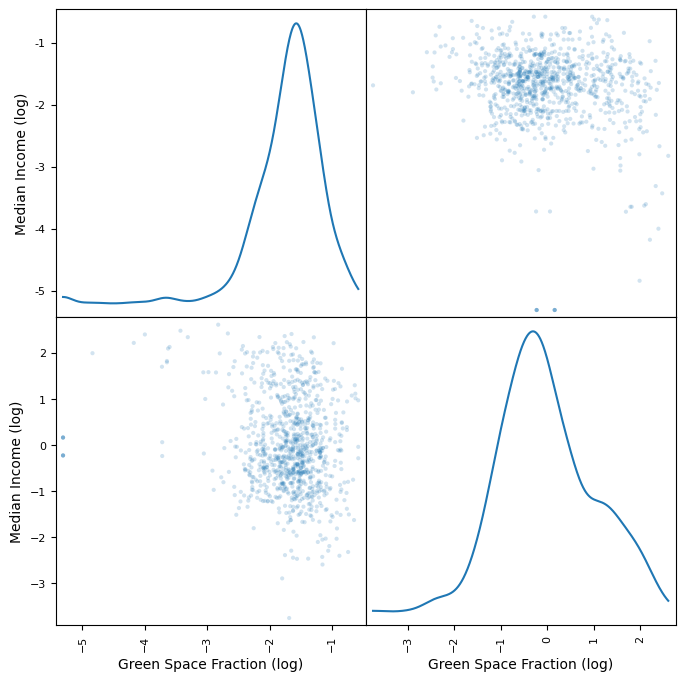

In [28]:
# Merge the relevant columns for modeling 
chi_model_gdf = pd.merge(chi_tract_ndvi_gdf, chi_census_gdf, on='tract')
chi_model_gdf = chi_model_gdf[['tract','green_space_fraction', 'mean_ndvi', 'count', 'median_income', 
                               'per_capita_income', 'median_home_value', 
                               'single_family_homes_count', 'total_population']]
# Drop rows with any missing values
chi_model_gdf = chi_model_gdf.dropna()

# Check for any remaining missing values
print(chi_model_gdf.isnull().sum())

# Log-transform skewed variables
chi_model_gdf['median_income_log'] = np.log(chi_model_gdf['median_income'])
chi_model_gdf['per_capita_income_log'] = np.log(chi_model_gdf['per_capita_income'])
chi_model_gdf['median_home_value_log'] = np.log(chi_model_gdf['median_home_value'])

# Standardize the predictor variables
scaler = StandardScaler()
predictors = chi_model_gdf[['median_income_log']].set_index(chi_model_gdf['tract'])

scaled_predictors = scaler.fit_transform(predictors)

# Convert scaled predictors back to DataFrame
scaled_predictors_df = pd.DataFrame(scaled_predictors, columns=predictors.columns)
scaled_predictors_df['tract'] = chi_model_gdf['tract']
scaled_predictors_df['green_space_fraction_log'] = np.log(chi_model_gdf['green_space_fraction'])
# scaled_predictors_df['mean_ndvi'] = chi_model_gdf['mean_ndvi']
# scaled_predictors_df['count'] = chi_model_gdf['count']

# Display the scaled predictors DataFrame
scaled_predictors_df.head()

from pandas.plotting import scatter_matrix
import matplotlib.pyplot as plt

assumptions_plot = scatter_matrix(scaled_predictors_df[[
    'green_space_fraction_log', 
    'median_income_log']], 
    alpha=0.2, figsize=(8, 8), diagonal='kde')

# Set the x-label and y-label of the plots
for ax in assumptions_plot.ravel():
    ax.set_xlabel('Green Space Fraction (log)')
    ax.set_ylabel('Median Income (log)')

# save the plot
plt.savefig('assumptions_plot.png')


### Fit and Predict

If you have worked with statistical models before, you may notice that the `scikitlearn` library has a slightly different approach than many software packages. For example, `scikitlearn` emphasizes generic model performance measures like cross-validation and importance over coefficient p-values and correlation. The scikitlearn approach is meant to generalize more smoothly to machine learning (ML) models where the statistical significance is harder to derive mathematically.

**YOUR TASK:**

  1. Use the scikitlearn documentation and/or ChatGPT as a starting point, split your data into training and testing datasets.
  2. Fit a linear regression to your training data.
  3. Use your fitted model to predict the testing values.
  4. Plot the predicted values against the measured values. You can use the following plotting code as a starting point:
  
```python
(
    test_df
    .hvplot.scatter(x='measured', y='predicted')
    .opts(aspect='equal', xlim=(0, y_max), ylim=(0, y_max), width=600, height=600)
) * hv.Slope(slope=1, y_intercept=0).opts(color='black')
```

In [30]:
# Load your processed data
data = scaled_predictors_df.set_index('tract')

# Define your features and target variable
X = data[['median_income_log']]
y = data['green_space_fraction_log']

# Split the data into training and testing sets (80% train, 20% test)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Check the shapes of the train and test sets
print(X_train.shape, X_test.shape, y_train.shape, y_test.shape)

# Initialize the linear regression model
model = LinearRegression()

# Fit the model to the training data
model.fit(X_train, y_train)

# Print the coefficients and intercept of the model
print("Coefficients:", model.coef_)
print("Intercept:", model.intercept_)

# Predict the target variable for the testing data
y_pred = model.predict(X_test)

# Calculate performance metrics
mse = mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)

print("Mean Squared Error:", mse)
print("R-squared:", r2)

# Create a DataFrame for plotting
test_df = pd.DataFrame({'measured': np.exp(y_test), 'predicted': np.exp(y_pred)})

# Define the maximum value for the plot limits
y_max = max(test_df['measured'].max(), test_df['predicted'].max())

# Plot the results
(
    test_df.hvplot.scatter(x='measured', y='predicted')
    .opts(aspect='equal', xlim=(0, y_max), ylim=(0, y_max), width=600, height=600)
) * hv.Slope(slope=1, y_intercept=0).opts(color='black')

(764, 1) (192, 1) (764,) (192,)
Coefficients: [-0.10844614]
Intercept: -1.7148028160425313
Mean Squared Error: 0.27833364404435434
R-squared: -0.01855335093306376


:Overlay
   .Scatter.I    :Scatter   [measured]   (predicted)
   .Annotation.I :Slope   [x,y]

### Spatial bias

We always need to think about bias, or systematic error, in model results. Every model is going to have some error, but we'd like to see that error evenly distributed. When the error is systematic, it can be an indication that we are missing something important in the model.

In geographic data, it is common for location to be a factor that doesn't get incorporated into models. After all -- we generally expect places that are right next to each other to be more similar than places that are far away (this phenomenon is known as *spatial autocorrelation*). However, models like this linear regression don't take location into account at all.

**YOUR TASK:**

  1. Compute the model error (predicted - measured) for each census tract
  2. Plot the error as a chloropleth map with a diverging color scheme
  3. Looking at both of your error plots, what do you notice? What are some possible explanations for any bias you see in your model?

In [31]:
# Compute the model error
test_df['error'] = test_df['predicted'] - test_df['measured']

# Display the first few rows to verify
test_df.head()
print(test_df.index)

test_df = test_df.reset_index().rename(columns={'index': 'tract'})

test_df.head()

chi_census_gdf.columns

# Check for duplicate 'tract' values in chi_census_gdf
if chi_census_gdf['TRACTCE'].duplicated().any():
    print("Duplicate 'TRACTCE' values found in chi_census_gdf")

# Check for duplicate 'tract' values in test_df
if test_df['tract'].duplicated().any():
    print("Duplicate 'tract' values found in test_df")

# Drop duplicate 'TRACTCE' values in chi_census_gdf
chi_census_gdf = chi_census_gdf.drop_duplicates(subset='TRACTCE', keep='first')


# # Check for duplicate column names in chi_census_gdf
# if chi_census_gdf.columns.duplicated().any():
#     print("Duplicate column names found in chi_census_gdf")

# # Check for duplicate column names in test_df
# if test_df.columns.duplicated().any():
#     print("Duplicate column names found in test_df")
 
# Merge the error data with the geographic data
error_gdf = chi_census_gdf.merge(test_df, left_on='TRACTCE', right_on='tract')

# Check the merged GeoDataFrame
error_gdf.head()



Index([520200, 838100, 251600, 200300, 570300, 250600, 381200, 271200,  10201,
       650100,
       ...
       839100,  70700, 480100, 560400, 810400, 230500, 730202, 844700, 710100,
        60200],
      dtype='int64', name='tract', length=192)
Duplicate 'TRACTCE' values found in chi_census_gdf
Duplicate 'tract' values found in test_df


,STATEFP,COUNTYFP,TRACTCE,GEOID,GEOIDFQ,NAME_left,NAMELSAD,MTFCC,FUNCSTAT,ALAND,...,per_capita_income,median_home_value,single_family_homes_count,total_population,state,county,tract,measured,predicted,error
0,17,031,320101,17031320101,1400000US17031320101,3201.01,Census Tract 3201.01,G5020,S,465726,...,153136.0,562500.0,82.0,7952.0,17,31,320101,0.178071,0.141322,-0.036749
1,17,031,612200,17031612200,1400000US17031612200,6122,Census Tract 6122,G5020,S,898079,...,15324.0,167700.0,396.0,3681.0,17,31,612200,0.270434,0.198311,-0.072124
2,17,031,844700,17031844700,1400000US17031844700,8447,Census Tract 8447,G5020,S,401852,...,19875.0,121000.0,117.0,1573.0,17,31,844700,0.116128,0.196006,0.079878
3,17,031,730202,17031730202,1400000US17031730202,7302.02,Census Tract 7302.02,G5020,S,872692,...,27068.0,161800.0,933.0,3064.0,17,31,730202,0.163215,0.187544,0.024329
4,17,031,835600,17031835600,1400000US17031835600,8356,Census Tract 8356,G5020,S,917505,...,14433.0,180100.0,73.0,838.0,17,31,835600,0.172832,0.233171,0.060339


In [32]:
# Create a map of all tracts
all_tracts_map = chi_census_gdf.hvplot.polygons(
    'geometry',
    geo=True, 
    line_color='black',
    line_width=0.2,
    fill_color='white'
)

err_plot = error_gdf.hvplot(c='error', geo=True, cmap='PiYG',tiles=True,
                                width=500,height=500,title='Prediction Error', colorbar=True, 
                                clabel='error')

# Replot NDVI and median income with bounding box 
ndvi_plot = chi_tract_ndvi_gdf.hvplot(c='mean_ndvi', geo=True, cmap='YlGn',tiles=True,
                                width=500,height=500,title='Mean NDVI', colorbar=True, 
                                clabel='NDVI')
income_plot = chi_census_gdf.hvplot(c='median_income', geo=True,cmap='YlOrRd', tiles=True,
                                width=500, height=500,title='Median Income', colorbar=True,
                                clabel='Income')

combined_plot = ndvi_plot + income_plot

error_map = all_tracts_map * err_plot

final_map = combined_plot + error_map

final_map

:Layout
   .Overlay.I   :Overlay
      .WMTS.I     :WMTS   [Longitude,Latitude]
      .Polygons.I :Polygons   [Longitude,Latitude]   (mean_ndvi)
   .Overlay.II  :Overlay
      .WMTS.I     :WMTS   [Longitude,Latitude]
      .Polygons.I :Polygons   [Longitude,Latitude]   (median_income)
   .Overlay.III :Overlay
      .Polygons.I  :Polygons   [Longitude,Latitude]
      .WMTS.I      :WMTS   [Longitude,Latitude]
      .Polygons.II :Polygons   [Longitude,Latitude]   (error)

In [33]:
# Save the plot to an HTML file
error_plot_path = os.path.join(data_dir, 'error.html')
hvplot.save(error_map, error_plot_path)

# Save the plot to an HTML file
error_combined_plot_path = os.path.join(data_dir, 'error_combined.html')
hvplot.save(final_map, error_combined_plot_path)

# Get the current working directory
current_dir = os.getcwd()

# Save the plot to an HTML file in the same directory as the notebook
error_plot_path = os.path.join(current_dir, 'error.html')
hvplot.save(error_map, error_plot_path)

# Save the plot to an HTML file
error_combined_plot_path = os.path.join(current_dir, 'error_combined.html')
hvplot.save(final_map, error_combined_plot_path)

We can only see the predicted values's error for tracts that were not used for the training data. The error plot does not seem to signal any clear direction for over or underprediction. Although considering the areas where the model overpredicts, they tend to be at tracts where the higher median income downtown areas are located in the central area of the city. This make logical sense since the greeness at those locations are limited. While the underprediction seems to happen in the more suburban tracts that have higher fraction of greeness, but the median income tends to be lower. 

### Full Solution using the log_median_income as predictor

In [34]:
# Merge the relevant columns for modeling 
model_df = pd.merge(chi_tract_ndvi_gdf, chi_census_gdf, on='tract')
model_df = model_df[['tract','green_space_fraction', 'mean_ndvi', 'count', 'median_income', 
                               'per_capita_income', 'median_home_value', 
                               'single_family_homes_count', 'total_population']].set_index(model_df['tract'])
# Drop rows with any missing values
model_df = model_df.dropna()

# Check for any remaining missing values
print(model_df.isnull().sum())

# Log-transform skewed variables
model_df['median_income_log'] = np.log(model_df['median_income'])
model_df['log_per_capita_income'] = np.log(model_df['per_capita_income'])
model_df['median_home_value_log'] = np.log(model_df['median_home_value'])
model_df['log_frac_mixed'] = np.log(model_df['green_space_fraction'])

from sklearn.model_selection import train_test_split
from sklearn import linear_model

model_df[['log_frac_mixed', 'median_income_log']]

X = model_df[['median_income_log']]
y = model_df[['log_frac_mixed']]

X_train, X_test, y_train, y_test = sklearn.model_selection.train_test_split(
    X, y, random_state=42)

linear_reg = linear_model.LinearRegression().fit(X_train, y_train)

y_hat = np.exp(linear_reg.predict(X_test))

test_df = y_test.copy()
test_df['y_hat'] = linear_reg.predict(X_test)
test_df['measured'] = np.exp(y_test)
test_df['predicted'] = np.exp(test_df.y_hat)
y_max = float(test_df.measured.max())
(
    test_df.hvplot.scatter(x='measured', y='predicted')
    .opts(aspect='equal', xlim=(0, y_max), ylim=(0, y_max), width=600, height=600)
) * hv.Slope(slope=1, y_intercept=0).opts(color='black')




tract                        0
green_space_fraction         0
mean_ndvi                    0
count                        0
median_income                0
per_capita_income            0
median_home_value            0
single_family_homes_count    0
total_population             0
dtype: int64


:Overlay
   .Scatter.I    :Scatter   [measured]   (predicted)
   .Annotation.I :Slope   [x,y]

In [35]:
# This solution  
model_df['pred_frac_mixed'] = np.exp(linear_reg.predict(X))

model_df['err_frac_mixed'] = model_df['pred_frac_mixed'] - model_df['green_space_fraction']

model_df = model_df.reset_index(drop=True)

model_gdf = chi_census_gdf.merge(model_df, on='tract')
# (
#     plot_chloropleth(model_df, color = 'err_frac_mixed', cmap='RdBu')
#     .redim.range(err_frac_mixed=(-.3, .3))
#     .opts(frame_width=600, aspect='equal')
# )

error_full = model_gdf.hvplot(c='err_frac_mixed', geo=True, cmap='RdBu',tiles=True,
                                width=500,height=500,title='NDVI Prediction Error', colorbar=True, 
                                clabel='Prediction Error')

error_full




:Overlay
   .WMTS.I     :WMTS   [Longitude,Latitude]
   .Polygons.I :Polygons   [Longitude,Latitude]   (err_frac_mixed)

In [36]:
# Get the current working directory
current_dir = os.getcwd()
# Save the plot to an HTML file in the same directory as the notebook
error_full_path = os.path.join(current_dir, 'error_median_income_NDVI.html')
hvplot.save(error_full, error_full_path)

In [37]:
error_final_map = all_tracts_map * error_full

final_full_map = combined_plot + error_final_map

final_full_map

# Save the plot to an HTML file
hvplot.save(final_full_map, 'error_combined_full_plot.html')

The error plot does not seem to signal any clear direction for over or underprediction. Although considering the areas where the model overpredicts, they tend to be at tracts where the higher median income downtown areas are located in the central area of the city. This make logical sense since the greeness at those locations are spatially limited. While the underprediction seems to happen in the more suburban tracts that have higher fraction of greeness, but the median income tends to be lower. 